# Demonstration of cap parameter for false-color representations of hyperspectral data

In this notebook, we will demonstrate how different values for the `cap` parameters of each spectral component will affect their relative visibilities in false color images. These parameters are used both in the GMOdetector workflow and the underlying `CubeGLM` Python package for hyperspectral analysis.<br>
This parameter can be thought of similarly to the exposure on a camera. However, we have a seperate cap for each spectral component used to produce a false color image. When the cap for a given component is lowered, that component will appear brighter relative to the other components, and areas with very high signal for the component will have clipped signal, similar to saturation resulting from overexposure on a camera. Conversely, when the cap for a given component is increased, that component will appear dimmer relative to others.

## Load CubeGLM (formerly `gmodetector_py`) and dependencies for this workflow

In [1]:
# Import classes
# Check version
from gmodetector_py import version
print('Running GMOdetector version ' + version.__version__)

from gmodetector_py import XMatrix
from gmodetector_py import Hypercube
from gmodetector_py import WeightArray
from gmodetector_py import ImageChannel
from gmodetector_py import FalseColor

# Import the one function we need to use before calling classes
from gmodetector_py import read_wavelengths

# The following are needed for this specific wrapper script only
import warnings
import argparse
import time
from datetime import datetime
import ntpath

import os # needed for basename

Warning message:
package ‘methods’ was built under R version 3.6.3 
During startup - Warning messages:
1: package ‘datasets’ was built under R version 3.6.3 
2: package ‘utils’ was built under R version 3.6.3 
3: package ‘grDevices’ was built under R version 3.6.3 
4: package ‘graphics’ was built under R version 3.6.3 
5: package ‘stats’ was built under R version 3.6.3 


Running GMOdetector version 0.0.875


## Compute an array of weights for spectral components in a sample hyperspectral image

These steps are described in detail in the [main readme for CubeGLM](https://github.com/naglemi/gmodetector_py/blob/master/README.md).

In [2]:
file_path = "../GMOnotebook/CubeGLM_sample_data/CRIB3_I5.0_F1.9_L100LED30_135126_10_1_3_Fluorescence.hdr"

In [3]:
spectral_library_path = "/home/michael/gmodetector_py/spectral_library/"

In [4]:
test_matrix = XMatrix(fluorophore_ID_vector = ['GFP', 'Chl', 'Noise'],
                      spectral_library_path = spectral_library_path,
                      intercept = 1,
                      wavelengths = read_wavelengths(file_path = file_path),
                      spectra_noise_threshold = 0.01,
                      min_desired_wavelength = 500,
                      max_desired_wavelength = 900)

test_cube = Hypercube(file_path,
                      min_desired_wavelength = 500,
                      max_desired_wavelength = 900)

weight_array = WeightArray(test_matrix=test_matrix,
                           test_cube=test_cube,
                           relu = True)

load mode isload_full_then_crop


/home/michael/anaconda3/envs/test-environment/lib/python3.7/site-packages/spectral/io/envi.py:175: UserWarning: Parameters with non-lowercase names encountered and converted to lowercase. To retain source file parameter name capitalization, set spectral.settings.envi_support_nonlowercase_params to True.
  warnings.warn(msg)


## Produce false color images from weight array with several different parameters for each `cap`.

### Produce false color image first with our commonly-used parameters that work well for poplar transformation images

In [5]:
stacked_component_image = FalseColor([ImageChannel(weight_array = weight_array,
                                                   desired_component_or_wavelength = "GFP",
                                                   color = 'green',
                                                   cap = 400),
                                      ImageChannel(weight_array = weight_array,
                                                   desired_component_or_wavelength = "Chl",
                                                   color = 'red',
                                                   cap = 200),
                                      ImageChannel(weight_array = weight_array,
                                                   desired_component_or_wavelength = "Noise",
                                                   color = 'blue',
                                                   cap = 200)])

Producing image channel for GFP with cap 400 in color green
Producing image channel for Chl with cap 200 in color red
Producing image channel for Noise with cap 200 in color blue


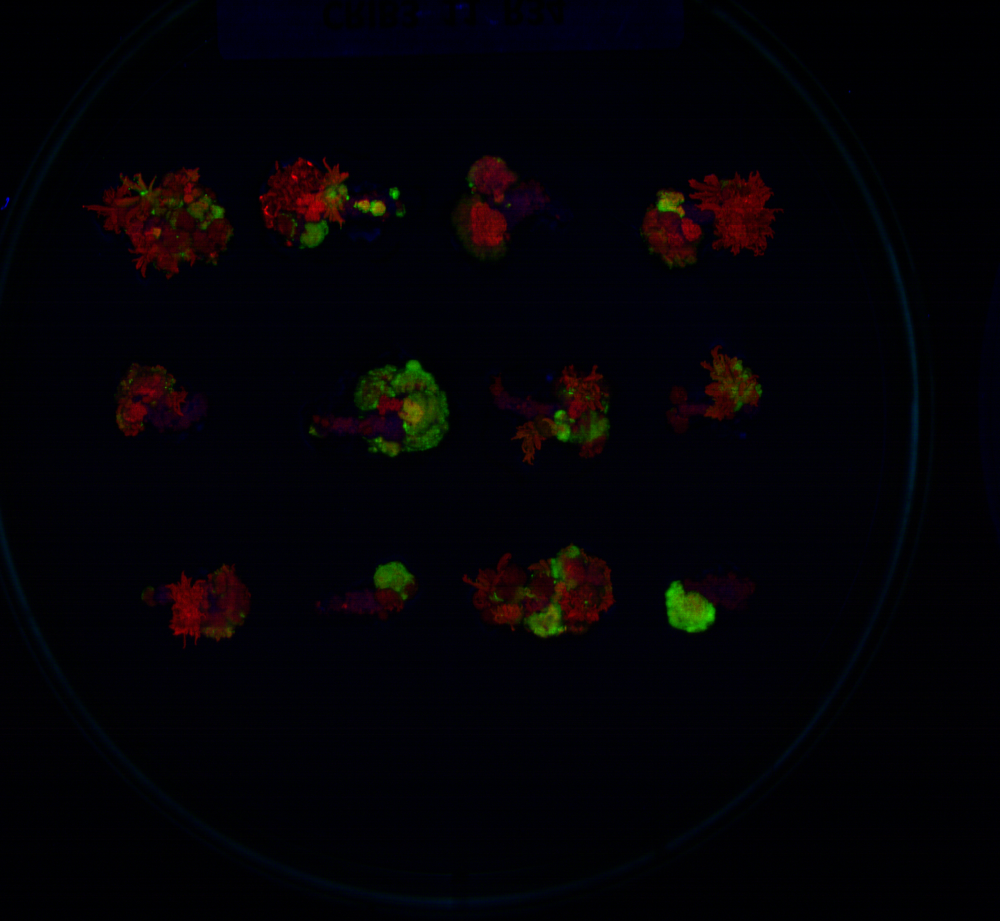

In [6]:
stacked_component_image.image

### Increase `GFP` cap from 400 to 800, resulting in reduced visibility of GFP signal relative to other components

In [7]:
stacked_component_image = FalseColor([ImageChannel(weight_array = weight_array,
                                                   desired_component_or_wavelength = "GFP",
                                                   color = 'green',
                                                   cap = 1000),
                                      ImageChannel(weight_array = weight_array,
                                                   desired_component_or_wavelength = "Chl",
                                                   color = 'red',
                                                   cap = 200),
                                      ImageChannel(weight_array = weight_array,
                                                   desired_component_or_wavelength = "Noise",
                                                   color = 'blue',
                                                   cap = 200)])

Producing image channel for GFP with cap 1000 in color green
Producing image channel for Chl with cap 200 in color red
Producing image channel for Noise with cap 200 in color blue


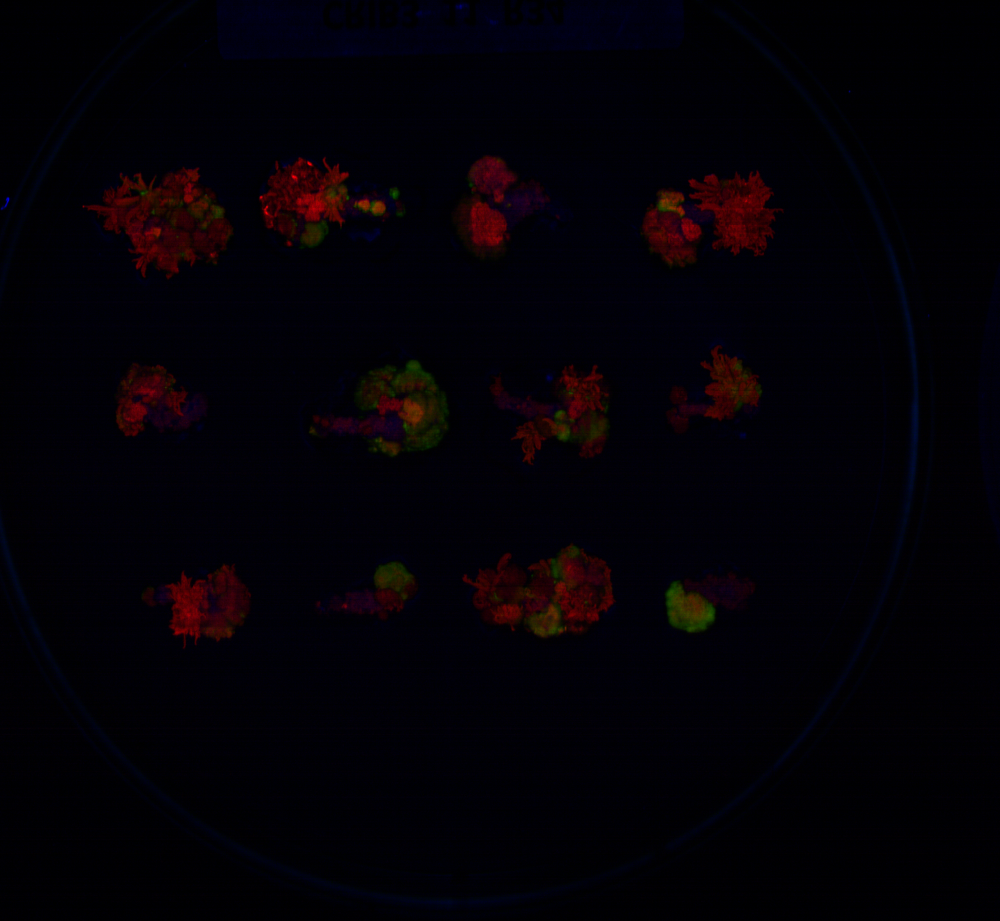

In [8]:
stacked_component_image.image

## Reduce cap for `Noise` from 200 to 100, leading to increased visibility of media, plate and plant autofluorescence.

In [9]:
stacked_component_image = FalseColor([ImageChannel(weight_array = weight_array,
                                                   desired_component_or_wavelength = "GFP",
                                                   color = 'green',
                                                   cap = 1000),
                                      ImageChannel(weight_array = weight_array,
                                                   desired_component_or_wavelength = "Chl",
                                                   color = 'red',
                                                   cap = 200),
                                      ImageChannel(weight_array = weight_array,
                                                   desired_component_or_wavelength = "Noise",
                                                   color = 'blue',
                                                   cap = 100)])

Producing image channel for GFP with cap 1000 in color green
Producing image channel for Chl with cap 200 in color red
Producing image channel for Noise with cap 100 in color blue


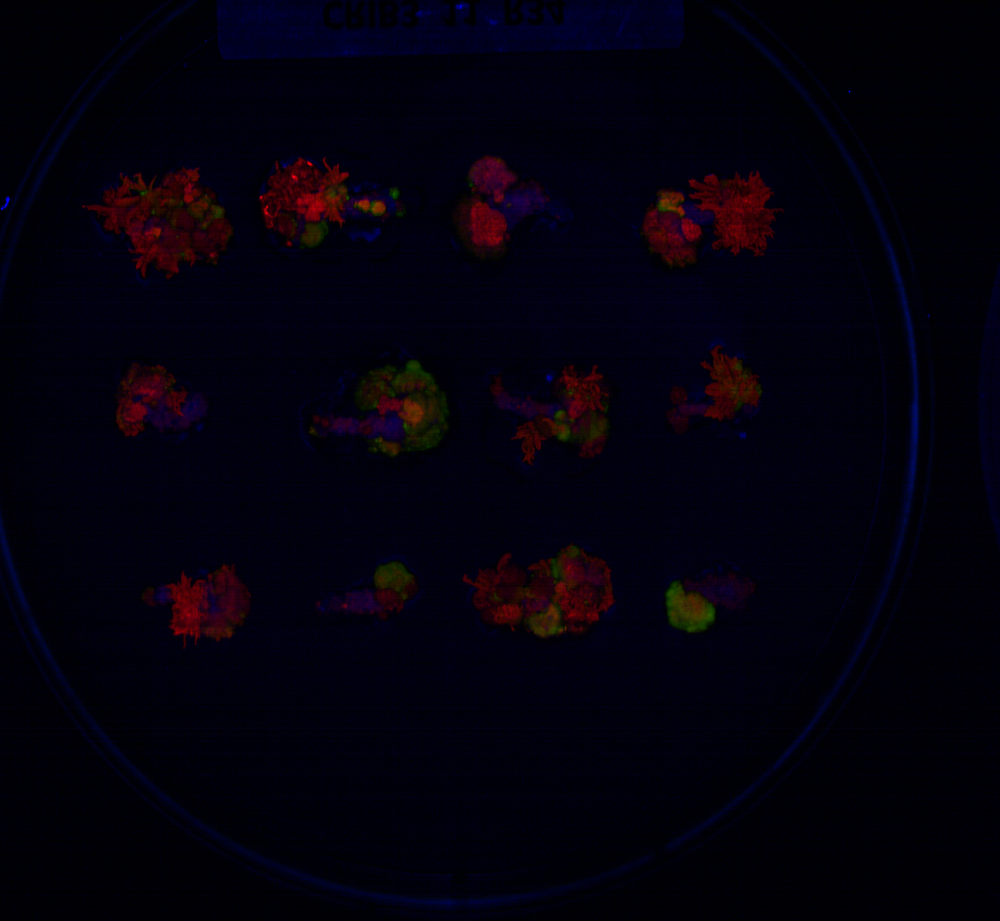

In [10]:
stacked_component_image.image